# Consolidated Analysis: All Disease Classes vs HC

This notebook performs a comprehensive analysis comparing all three disease classes (C_F, K_F, A_F) against healthy controls (HC).
Results are displayed in a consolidated manner to enable direct comparison between disease classes.

---

## #1 Import all necessary packages

In [1]:
import glob
import os

import numpy as np
from numpy.random import default_rng

import pandas as pd

from collections import Counter

from sklearn.metrics import (accuracy_score, roc_auc_score, confusion_matrix, classification_report, roc_curve)
from sklearn.pipeline import make_pipeline
from sklearn.base import clone

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold

from sklearn.svm       import SVC
from sklearn.ensemble  import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from catboost import CatBoostClassifier

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10

---

## #2 Defining each model configuration

In [2]:
models = [
    ("RandomForest",
     RandomForestClassifier(
         n_estimators = 100,
         max_features = 'sqrt',
         class_weight = 'balanced',
         random_state = 42,
         n_jobs       = -1)),

    ("SVM",
     make_pipeline(StandardScaler(),
                   SVC(kernel='linear',
                       probability=True,
                       class_weight='balanced',
                       random_state=42))),

    ("MLP",
     make_pipeline(StandardScaler(),
         MLPClassifier(hidden_layer_sizes=(50,),
                       max_iter     = 300,
                       random_state = 42,
                       early_stopping=False))),

    ("CatBoost",
     CatBoostClassifier(
         iterations    = 100,
         learning_rate = 0.1,
         depth         = 6,
         l2_leaf_reg   = 3,
         eval_metric   = 'AUC',
         random_seed   = 42,
         verbose=False))
]

---

## #3 Helper functions for evaluation

In [3]:
signal_order = ['F_V', 'F_AP', 'F_ML', 'COP_AP', 'COP_ML']

def build_subject_matrix(df, disease_class, signals=signal_order):
    """
    Build feature matrix and labels for a specific disease class vs HC.
    
    Parameters:
    -----------
    df : DataFrame
        The dataframe with all signals
    disease_class : str
        The disease class to compare with HC ('C_F', 'K_F', or 'A_F')
    signals : list
        Order of signals in the feature matrix
    
    Returns:
    --------
    X : array
        Feature matrix
    y : array
        Labels (0 = HC, 1 = disease_class)
    """
    feats, labels = [], []
    for sid, g in df.groupby('SUBJECT_ID'):
        g = g.sort_values('Time_Step')
        v = []
        
        for sig in signals:
            v.extend(g[sig].values)
            
        feats.append(v)
        labels.append(1 if g['CLASS_LABEL_DETAILED'].iloc[0] == disease_class else 0)

    max_len = max(len(v) for v in feats)
    X = np.array([v + [0.0]*(max_len-len(v)) for v in feats], dtype=np.float32)
    y = np.array(labels, dtype=int)
    
    return X, y

def kfold_eval(X_sub, y_sub, name, base_model, n_splits=5, verbose=True):
    """
    Evaluate a model using stratified K-fold cross-validation.
    """
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    acc_list  = []
    auc_list  = []
    spec_list = []
    sens_list = []

    y_t, y_p, y_prob = [], [], []

    for tr, te in skf.split(X_sub, y_sub):
        mdl = clone(base_model)
        mdl.fit(X_sub[tr], y_sub[tr])
        y_pred  = mdl.predict(X_sub[te])
        y_proba = mdl.predict_proba(X_sub[te])[:,1]

        y_t  .extend(y_sub[te])
        y_p  .extend(y_pred)
        y_prob.extend(y_proba)

        cm = confusion_matrix(y_sub[te], y_pred)
        tn, fp, fn, tp = cm.ravel()
        acc  = accuracy_score(y_sub[te], y_pred)
        auc  = roc_auc_score(y_sub[te], y_proba)
        spec = tn / (tn + fp)
        sens = tp / (tp + fn)

        acc_list.append(acc)
        auc_list.append(auc)
        spec_list.append(spec)
        sens_list.append(sens)

    # Calculate final metrics on all global forecasts
    cm_full = confusion_matrix(y_t, y_p)
    tn, fp, fn, tp = cm_full.ravel()
    acc_full  = accuracy_score(y_t, y_p)
    auc_full  = roc_auc_score(y_t, y_prob)
    spec_full = tn/(tn+fp)
    sens_full = tp/(tp+fn)

    if verbose:
        print(f"\n{name:<12}  Global results (all folds combined):")
        print(f"Acc {acc_full*100:5.2f}%  AUC {auc_full:5.3f}  "
            f"Spec {spec_full:4.2f}  Sens {sens_full:4.2f}")
        print("Confusion matrix:", cm_full.tolist())
        
        print(f"\n{name:<12}  Mean ± Std across folds:")
        print(f"Accuracy:   {np.mean(acc_list):.3f} ± {np.std(acc_list, ddof=1):.2f}")
        print(f"AUC:        {np.mean(auc_list):.3f} ± {np.std(auc_list, ddof=1):.2f}")
        print(f"Specificity:{np.mean(spec_list):.3f} ± {np.std(spec_list, ddof=1):.2f}")
        print(f"Sensitivity:{np.mean(sens_list):.3f} ± {np.std(sens_list, ddof=1):.2f}")
    
    # Return results for visualization
    return {
        'y_true': np.array(y_t),
        'y_pred': np.array(y_p),
        'y_proba': np.array(y_prob),
        'confusion_matrix': cm_full,
        'metrics': {
            'accuracy': {'mean': np.mean(acc_list), 'std': np.std(acc_list, ddof=1)},
            'auc': {'mean': np.mean(auc_list), 'std': np.std(auc_list, ddof=1)},
            'specificity': {'mean': np.mean(spec_list), 'std': np.std(spec_list, ddof=1)},
            'sensitivity': {'mean': np.mean(sens_list), 'std': np.std(sens_list, ddof=1)}
        }
    }

---

## #4 Helper functions for visualization

In [4]:
def plot_comparative_roc_curves(all_results, disease_classes, disease_names, save_path=None):
    """
    Plot ROC curves comparing all disease classes for each model.
    Creates a 2x2 subplot (one for each model) with 3 ROC curves per subplot (one per disease).
    """
    model_names = list(list(all_results.values())[0].keys())
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    axes = axes.ravel()
    
    disease_colors = {'C_F': '#E63946', 'K_F': '#2A9D8F', 'A_F': '#F77F00'}
    
    for model_idx, model_name in enumerate(model_names):
        ax = axes[model_idx]
        
        for disease_class in disease_classes:
            results = all_results[disease_class][model_name]
            
            # Calculate ROC curve
            fpr, tpr, _ = roc_curve(results['y_true'], results['y_proba'])
            auc_score = results['metrics']['auc']['mean']
            auc_std = results['metrics']['auc']['std']
            
            # Plot ROC curve
            ax.plot(fpr, tpr, color=disease_colors[disease_class], lw=2.5, 
                    label=f"{disease_names[disease_class]}: AUC={auc_score:.3f}±{auc_std:.3f}")
        
        # Plot diagonal reference line
        ax.plot([0, 1], [0, 1], 'k--', lw=1.5, alpha=0.5, label='Random')
        
        # Styling
        ax.set_xlim([-0.02, 1.02])
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('False Positive Rate', fontsize=12, fontweight='bold')
        ax.set_ylabel('True Positive Rate', fontsize=12, fontweight='bold')
        ax.set_title(f'{model_name}', fontsize=14, fontweight='bold', pad=10)
        ax.legend(loc='lower right', fontsize=10, framealpha=0.9)
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.set_aspect('equal')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Comparative ROC curves saved to: {save_path}")
    
    plt.show()
    return fig

In [5]:
def plot_comparative_metrics(all_results, disease_classes, disease_names, save_path=None):
    """
    Plot comparative metrics bar chart showing all disease classes side by side.
    Creates a 2x2 subplot (one for each metric) with grouped bars for each model and disease.
    """
    metrics = ['accuracy', 'auc', 'specificity', 'sensitivity']
    metric_labels = ['Accuracy', 'AUC', 'Specificity', 'Sensitivity']
    model_names = list(list(all_results.values())[0].keys())
    
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    axes = axes.ravel()
    
    disease_colors = {'C_F': '#E63946', 'K_F': '#2A9D8F', 'A_F': '#F77F00'}
    
    for metric_idx, (metric, metric_label) in enumerate(zip(metrics, metric_labels)):
        ax = axes[metric_idx]
        
        # Prepare data
        x = np.arange(len(model_names))
        width = 0.25
        
        for disease_idx, disease_class in enumerate(disease_classes):
            means = []
            stds = []
            
            for model_name in model_names:
                mean = all_results[disease_class][model_name]['metrics'][metric]['mean']
                std = all_results[disease_class][model_name]['metrics'][metric]['std']
                means.append(mean)
                stds.append(std)
            
            offset = (disease_idx - 1) * width
            bars = ax.bar(x + offset, means, width, yerr=stds,
                         label=disease_names[disease_class],
                         color=disease_colors[disease_class], alpha=0.8,
                         capsize=4, error_kw={'linewidth': 1.5, 'elinewidth': 1})
            
            # Add value labels on bars
            for bar, mean_val in zip(bars, means):
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height + 0.02,
                       f'{mean_val:.2f}',
                       ha='center', va='bottom', fontsize=8, fontweight='bold')
        
        # Styling
        ax.set_ylabel(f'{metric_label} Score', fontsize=12, fontweight='bold')
        ax.set_title(f'{metric_label}', fontsize=14, fontweight='bold', pad=10)
        ax.set_xticks(x)
        ax.set_xticklabels(model_names, fontsize=11)
        ax.legend(loc='lower right', fontsize=10, framealpha=0.9)
        ax.set_ylim([0, 1.1])
        ax.grid(True, axis='y', alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Comparative metrics plot saved to: {save_path}")
    
    plt.show()
    return fig

In [6]:
def plot_performance_heatmap(all_results, disease_classes, disease_names, save_path=None):
    """
    Plot heatmap showing performance of all models across all disease classes.
    Creates a 2x2 subplot (one for each metric).
    """
    metrics = ['accuracy', 'auc', 'specificity', 'sensitivity']
    metric_labels = ['Accuracy', 'AUC', 'Specificity', 'Sensitivity']
    model_names = list(list(all_results.values())[0].keys())
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()
    
    for metric_idx, (metric, metric_label) in enumerate(zip(metrics, metric_labels)):
        ax = axes[metric_idx]
        
        # Prepare data matrix: rows = models, cols = diseases
        data_matrix = []
        for model_name in model_names:
            row = []
            for disease_class in disease_classes:
                mean = all_results[disease_class][model_name]['metrics'][metric]['mean']
                row.append(mean)
            data_matrix.append(row)
        
        data_matrix = np.array(data_matrix)
        
        # Create annotations with mean ± std
        annotations = np.empty_like(data_matrix, dtype=object)
        for i, model_name in enumerate(model_names):
            for j, disease_class in enumerate(disease_classes):
                mean = all_results[disease_class][model_name]['metrics'][metric]['mean']
                std = all_results[disease_class][model_name]['metrics'][metric]['std']
                annotations[i, j] = f'{mean:.3f}\n±{std:.2f}'
        
        # Plot heatmap
        sns.heatmap(data_matrix, annot=annotations, fmt='', cmap='RdYlGn', 
                   cbar=True, square=False, ax=ax, vmin=0, vmax=1,
                   linewidths=2, linecolor='white',
                   cbar_kws={'label': metric_label, 'shrink': 0.8})
        
        # Styling
        disease_labels = [disease_names[dc] for dc in disease_classes]
        ax.set_xlabel('Disease Class', fontsize=12, fontweight='bold')
        ax.set_ylabel('Model', fontsize=12, fontweight='bold')
        ax.set_title(f'{metric_label}', fontsize=14, fontweight='bold', pad=10)
        ax.set_xticklabels(disease_labels, rotation=0, fontsize=11)
        ax.set_yticklabels(model_names, rotation=0, fontsize=11)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Performance heatmap saved to: {save_path}")
    
    plt.show()
    return fig

In [7]:
def plot_comparative_confusion_matrices(all_results, disease_classes, disease_names, model_name, save_path=None):
    """
    Plot confusion matrices for a specific model across all disease classes.
    Creates a 1x3 subplot.
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    for disease_idx, disease_class in enumerate(disease_classes):
        ax = axes[disease_idx]
        
        results = all_results[disease_class][model_name]
        cm = results['confusion_matrix']
        
        # Normalize confusion matrix
        cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        
        # Create annotations with both count and percentage
        annotations = np.empty_like(cm, dtype=object)
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                annotations[i, j] = f'{cm[i, j]}\n({cm_normalized[i, j]*100:.1f}%)'
        
        # Plot heatmap
        class_names = ['HC', disease_class]
        sns.heatmap(cm_normalized, annot=annotations, fmt='', cmap='Blues',
                   cbar=True, square=True, ax=ax, vmin=0, vmax=1,
                   linewidths=2, linecolor='white',
                   cbar_kws={'label': 'Normalized Count', 'shrink': 0.8})
        
        # Styling
        ax.set_xlabel('Predicted Label', fontsize=12, fontweight='bold')
        ax.set_ylabel('True Label', fontsize=12, fontweight='bold')
        ax.set_title(f'{disease_names[disease_class]}', fontsize=13, fontweight='bold', pad=10)
        ax.set_xticklabels(class_names, rotation=0, fontsize=11)
        ax.set_yticklabels(class_names, rotation=0, fontsize=11)
    
    fig.suptitle(f'Confusion Matrices - {model_name}', fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Confusion matrices saved to: {save_path}")
    
    plt.show()
    return fig

In [8]:
def plot_comparative_learning_curves(fraction_results, disease_classes, disease_names, save_path_prefix=None):
    """
    Plot learning curves comparing all disease classes for each model and metric.
    Creates 4 separate figures (one per metric), each with 2x2 subplots (one per model).
    Each subplot shows performance vs dataset size for all 3 diseases.
    X-axis goes from 100% to 10%.
    """
    metrics = ['accuracy', 'auc', 'specificity', 'sensitivity']
    metric_labels = ['Accuracy', 'AUC', 'Specificity', 'Sensitivity']
    model_names = list(list(fraction_results.values())[0][1.0].keys())

    disease_colors = {'C_F': '#E63946', 'K_F': '#2A9D8F', 'A_F': '#F77F00'}

    # Sort fractions in descending order (100% to 10%)
    fractions = sorted(fraction_results[disease_classes[0]].keys(), reverse=True)
    fractions_pct = [f * 100 for f in fractions]

    figures = []

    # Create one figure per metric
    for metric_idx, (metric, metric_label) in enumerate(zip(metrics, metric_labels)):
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        axes = axes.ravel()

        for model_idx, model_name in enumerate(model_names):
            ax = axes[model_idx]

            for disease_class in disease_classes:
                means = []
                stds = []

                for fraction in fractions:
                    mean = fraction_results[disease_class][fraction][model_name]['metrics'][metric]['mean']
                    std = fraction_results[disease_class][fraction][model_name]['metrics'][metric]['std']
                    means.append(mean)
                    stds.append(std)

                means = np.array(means)
                stds = np.array(stds)

                # Plot line with shaded error region
                ax.plot(fractions_pct, means, marker='o', markersize=6,
                       linewidth=2.5, label=disease_names[disease_class],
                       color=disease_colors[disease_class])
                ax.fill_between(fractions_pct, means - stds, means + stds,
                               alpha=0.2, color=disease_colors[disease_class])

            # Styling
            ax.set_xlabel('Dataset Size (%)', fontsize=11, fontweight='bold')
            ax.set_ylabel(f'{metric_label}', fontsize=11, fontweight='bold')
            ax.set_title(f'{model_name}', fontsize=12, fontweight='bold', pad=10)
            ax.legend(loc='best', fontsize=10, framealpha=0.9)
            ax.grid(True, alpha=0.3, linestyle='--')
            # Set x-axis from 100% to 10% (inverted: max first, min second)
            ax.set_xlim([fractions_pct[0] + 5, fractions_pct[-1] - 5])
            # Set all x-ticks to show: 100, 90, 80, 70, 60, 50, 40, 30, 20, 10
            ax.set_xticks([100, 90, 80, 70, 60, 50, 40, 30, 20, 10])
            ax.set_ylim([0, 1.05])

        # Add overall title for the metric
        fig.suptitle(f'Learning Curves - {metric_label}', fontsize=16, fontweight='bold', y=1.00)
        plt.tight_layout()

        # Save individual figure
        if save_path_prefix:
            save_path = f"{save_path_prefix}_{metric}.png"
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Learning curve for {metric_label} saved to: {save_path}")

        plt.show()
        figures.append(fig)

    return figures

In [9]:
def plot_learning_curves_by_metric(fraction_results, disease_classes, disease_names, save_path=None):
    """
    Plot learning curves showing all models and diseases for each metric.
    Creates a 2x2 subplot (one for each metric).
    Each subplot shows all models and all 3 diseases.
    X-axis goes from 100% to 10%.
    """
    metrics = ['accuracy', 'auc', 'specificity', 'sensitivity']
    metric_labels = ['Accuracy', 'AUC', 'Specificity', 'Sensitivity']
    model_names = list(list(fraction_results.values())[0][1.0].keys())

    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    axes = axes.ravel()

    disease_colors = {'C_F': '#E63946', 'K_F': '#2A9D8F', 'A_F': '#F77F00'}
    model_styles = {
        'RandomForest': '-',
        'SVM': '--',
        'MLP': '-.',
        'CatBoost': ':'
    }

    # Sort fractions in descending order (100% to 10%)
    fractions = sorted(fraction_results[disease_classes[0]].keys(), reverse=True)
    fractions_pct = [f * 100 for f in fractions]

    for metric_idx, (metric, metric_label) in enumerate(zip(metrics, metric_labels)):
        ax = axes[metric_idx]

        for disease_class in disease_classes:
            for model_name in model_names:
                means = []
                stds = []

                for fraction in fractions:
                    mean = fraction_results[disease_class][fraction][model_name]['metrics'][metric]['mean']
                    std = fraction_results[disease_class][fraction][model_name]['metrics'][metric]['std']
                    means.append(mean)
                    stds.append(std)

                means = np.array(means)
                stds = np.array(stds)

                # Plot line
                label = f"{disease_names[disease_class]} - {model_name}"
                ax.plot(fractions_pct, means, marker='o', markersize=5,
                       linewidth=2, label=label,
                       color=disease_colors[disease_class],
                       linestyle=model_styles[model_name], alpha=0.8)

        # Styling
        ax.set_xlabel('Dataset Size (%)', fontsize=12, fontweight='bold')
        ax.set_ylabel(f'{metric_label} Score', fontsize=12, fontweight='bold')
        ax.set_title(f'{metric_label} vs Dataset Size', fontsize=14, fontweight='bold', pad=10)
        ax.legend(loc='best', fontsize=8, framealpha=0.9, ncol=2)
        ax.grid(True, alpha=0.3, linestyle='--')
        # Set x-axis from 100% to 10% (inverted: max first, min second)
        ax.set_xlim([fractions_pct[0] + 5, fractions_pct[-1] - 5])
        # Set all x-ticks to show: 100, 90, 80, 70, 60, 50, 40, 30, 20, 10
        ax.set_xticks([100, 90, 80, 70, 60, 50, 40, 30, 20, 10])
        ax.set_ylim([0, 1.05])

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Learning curves by metric saved to: {save_path}")

    plt.show()
    return fig

---

## #5 Load and prepare data for all disease classes

In [10]:
# Load metadata
database_path = '../../../database'
metadata = pd.read_csv(os.path.join(database_path, 'metadata.csv'))

# Define disease classes to analyze
disease_classes = ['C_F', 'K_F', 'A_F']
disease_names = {
    'C_F': 'Calcaneus Fracture',
    'K_F': 'Knee Fracture',
    'A_F': 'Ankle Fracture'
}

print("Disease classes to analyze:")
for dc in disease_classes:
    n_subjects = len(metadata[metadata['CLASS_LABEL_DETAILED'] == dc]['SUBJECT_ID'].unique())
    print(f"  {dc} ({disease_names[dc]}): {n_subjects} subjects")

n_hc = len(metadata[metadata['CLASS_LABEL_DETAILED'] == 'HC']['SUBJECT_ID'].unique())
print(f"  HC (Healthy Controls): {n_hc} subjects")

Disease classes to analyze:
  C_F (Calcaneus Fracture): 380 subjects
  K_F (Knee Fracture): 285 subjects
  A_F (Ankle Fracture): 338 subjects
  HC (Healthy Controls): 211 subjects


## #6 Process data for each disease class

For each disease class, we will:
1. Filter the data (disease + HC)
2. Transform to vertical format
3. Merge signals
4. Filter by affected side (left side only)

In [11]:
# Dictionary to store processed dataframes for each disease class
disease_dataframes = {}

for disease_class in disease_classes:
    print(f"\n{'='*70}")
    print(f"Processing {disease_class} ({disease_names[disease_class]}) vs HC")
    print(f"{'='*70}")
    
    # Filter metadata for this disease class + HC
    filtered_metadata = metadata[metadata['CLASS_LABEL_DETAILED'].isin([disease_class, 'HC'])]
    subject_ids = filtered_metadata['SUBJECT_ID'].unique()
    
    # Create output folder for this disease class
    output_folder = f'selected_data/{disease_class}_vs_HC/'
    os.makedirs(output_folder, exist_ok=True)
    
    # Check if processed files already exist
    merged_file = os.path.join(output_folder, 'merged_filtered_data.csv')
    
    if os.path.exists(merged_file):
        print(f"Loading existing processed data from {merged_file}")
        filtered_df = pd.read_csv(merged_file)
    else:
        print("Processing raw data...")
        
        # Load all signal files
        F_V_left = pd.read_csv(os.path.join(database_path, 'F_V_left.csv'))
        F_AP_left = pd.read_csv(os.path.join(database_path, 'F_AP_left.csv'))
        F_ML_left = pd.read_csv(os.path.join(database_path, 'F_ML_left.csv'))
        COP_AP_left = pd.read_csv(os.path.join(database_path, 'COP_AP_left.csv'))
        COP_ML_left = pd.read_csv(os.path.join(database_path, 'COP_ML_left.csv'))
        
        # Function to melt and filter data
        def process_signal(df, signal_name, subject_ids, filtered_metadata):
            # Filter for subject IDs and TRIAL_ID = 1
            filtered_data = df[(df['SUBJECT_ID'].isin(subject_ids)) & (df['TRIAL_ID'] == 1)]
            
            if filtered_data.empty:
                return None
            
            # Merge with metadata
            filtered_data = filtered_data.merge(
                filtered_metadata[['SUBJECT_ID', 'CLASS_LABEL_DETAILED']], 
                on='SUBJECT_ID', 
                how='left'
            )
            
            # Get column prefix
            prefix = signal_name + '_'
            
            # Melt to long format
            melted_data = pd.melt(
                filtered_data,
                id_vars=['SUBJECT_ID', 'SESSION_ID', 'TRIAL_ID', 'CLASS_LABEL_DETAILED'],
                value_vars=[col for col in df.columns if col.startswith(prefix)],
                var_name='Time_Step',
                value_name=signal_name
            )
            
            # Extract time step number
            melted_data['Time_Step'] = melted_data['Time_Step'].str.extract('(\d+)').astype(int)
            melted_data = melted_data.drop_duplicates()
            melted_data = melted_data.sort_values(by=['SUBJECT_ID', 'SESSION_ID', 'TRIAL_ID', 'Time_Step'])
            
            return melted_data
        
        # Process each signal
        F_V = process_signal(F_V_left, 'F_V', subject_ids, filtered_metadata)
        F_AP = process_signal(F_AP_left, 'F_AP', subject_ids, filtered_metadata)
        F_ML = process_signal(F_ML_left, 'F_ML', subject_ids, filtered_metadata)
        COP_AP = process_signal(COP_AP_left, 'COP_AP', subject_ids, filtered_metadata)
        COP_ML = process_signal(COP_ML_left, 'COP_ML', subject_ids, filtered_metadata)
        
        # Merge all signals
        merge_keys = ['SUBJECT_ID', 'SESSION_ID', 'TRIAL_ID', 'Time_Step']
        merged_df = F_V.merge(F_AP[merge_keys + ['F_AP']], on=merge_keys)
        merged_df = merged_df.merge(F_ML[merge_keys + ['F_ML']], on=merge_keys)
        merged_df = merged_df.merge(COP_AP[merge_keys + ['COP_AP']], on=merge_keys)
        merged_df = merged_df.merge(COP_ML[merge_keys + ['COP_ML']], on=merge_keys)
        
        # Filter by affected side (left = 0)
        disease_left_ids = metadata[
            (metadata['CLASS_LABEL_DETAILED'] == disease_class) &
            (metadata['AFFECTED_SIDE'] == 0)
        ]['SUBJECT_ID'].unique()
        
        hc_ids = metadata[
            (metadata['CLASS_LABEL_DETAILED'] == 'HC')
        ]['SUBJECT_ID'].unique()
        
        disease_df = merged_df[merged_df['SUBJECT_ID'].isin(disease_left_ids)]
        hc_df = merged_df[merged_df['SUBJECT_ID'].isin(hc_ids)]
        
        filtered_df = pd.concat([disease_df, hc_df], ignore_index=True)
        
        # Save processed data
        filtered_df.to_csv(merged_file, index=False)
        print(f"Saved processed data to {merged_file}")
    
    # Store in dictionary
    disease_dataframes[disease_class] = filtered_df
    
    # Print summary
    print(f"\nDataframe shape: {filtered_df.shape}")
    summary = filtered_df[['SUBJECT_ID', 'CLASS_LABEL_DETAILED']].drop_duplicates().groupby('CLASS_LABEL_DETAILED').count()
    print(summary)

print(f"\n{'='*70}")
print("Data processing completed for all disease classes!")
print(f"{'='*70}")


Processing C_F (Calcaneus Fracture) vs HC
Loading existing processed data from selected_data/C_F_vs_HC/merged_filtered_data.csv

Dataframe shape: (118069, 10)
                      SUBJECT_ID
CLASS_LABEL_DETAILED            
C_F                          167
HC                           209

Processing K_F (Knee Fracture) vs HC
Loading existing processed data from selected_data/K_F_vs_HC/merged_filtered_data.csv

Dataframe shape: (102010, 10)
                      SUBJECT_ID
CLASS_LABEL_DETAILED            
HC                           209
K_F                          141

Processing A_F (Ankle Fracture) vs HC
Loading existing processed data from selected_data/A_F_vs_HC/merged_filtered_data.csv

Dataframe shape: (104131, 10)
                      SUBJECT_ID
CLASS_LABEL_DETAILED            
A_F                          148
HC                           209

Data processing completed for all disease classes!


## #7 Evaluate models for all disease classes with multiple dataset fractions

For each disease class, evaluate all models using K-fold cross-validation on different dataset sizes.

In [12]:
# Dictionary to store all results
# Structure: {disease_class: {fraction: {model_name: results_dict}}}
fraction_results = {}

# Define fractions to evaluate
fractions = [1.00, 0.90, 0.80, 0.70, 0.60, 0.50, 0.40, 0.30, 0.20, 0.10]

for disease_class in disease_classes:
    print(f"\n{'='*70}")
    print(f"Evaluating models for {disease_class} ({disease_names[disease_class]}) vs HC")
    print(f"{'='*70}")

    # Get processed dataframe
    filtered_df = disease_dataframes[disease_class]

    # Build feature matrix and labels (100% data)
    X_full, y_full = build_subject_matrix(filtered_df, disease_class)
    print(f"\nTotal subjects (100%): {len(y_full)} | {Counter(y_full)} (0 = HC, 1 = {disease_class})")
    print(f"Feature matrix shape: {X_full.shape}")

    # Initialize results storage for this disease
    fraction_results[disease_class] = {}

    # Random generator for stratified sampling
    rng = default_rng(42)
    idx_hc = np.where(y_full == 0)[0]
    idx_disease = np.where(y_full == 1)[0]

    # Evaluate for each fraction
    for f in fractions:
        print(f"\n{'-'*70}")
        print(f"Dataset fraction: {f:.0%}")
        print(f"{'-'*70}")

        # Sample data based on fraction
        if f == 1.0:
            # Use all data
            sel = np.arange(len(y_full))
        else:
            # Stratified sampling
            n_hc = max(1, int(f * len(idx_hc)))
            n_disease = max(1, int(f * len(idx_disease)))
            sel = np.hstack([
                rng.choice(idx_hc, n_hc, replace=False),
                rng.choice(idx_disease, n_disease, replace=False)
            ])

        X_sub, y_sub = X_full[sel], y_full[sel]
        print(f"Subjects: {len(y_sub)} | HC={sum(y_sub==0)}, {disease_class}={sum(y_sub==1)}")

        # Store results for this fraction
        fraction_results[disease_class][f] = {}

        # Evaluate each model
        for model_name, model in models:
            print(f"\n  Model: {model_name}")

            results = kfold_eval(X_sub, y_sub, model_name, model, n_splits=5, verbose=False)
            fraction_results[disease_class][f][model_name] = results

            # Print summary
            metrics = results['metrics']
            print(f"    Acc: {metrics['accuracy']['mean']:.3f}±{metrics['accuracy']['std']:.2f}  "
                  f"AUC: {metrics['auc']['mean']:.3f}±{metrics['auc']['std']:.2f}  "
                  f"Spec: {metrics['specificity']['mean']:.3f}±{metrics['specificity']['std']:.2f}  "
                  f"Sens: {metrics['sensitivity']['mean']:.3f}±{metrics['sensitivity']['std']:.2f}")

print(f"\n{'='*70}")
print("Model evaluation completed for all disease classes and all fractions!")
print(f"{'='*70}")

# Store 100% results separately for compatibility with existing plots
all_results = {dc: fraction_results[dc][1.0] for dc in disease_classes}


Evaluating models for C_F (Calcaneus Fracture) vs HC

Total subjects (100%): 376 | Counter({0: 209, 1: 167}) (0 = HC, 1 = C_F)
Feature matrix shape: (376, 5555)

----------------------------------------------------------------------
Dataset fraction: 100%
----------------------------------------------------------------------
Subjects: 376 | HC=209, C_F=167

  Model: RandomForest
    Acc: 0.915±0.04  AUC: 0.968±0.02  Spec: 0.961±0.05  Sens: 0.856±0.05

  Model: SVM
    Acc: 0.819±0.04  AUC: 0.897±0.05  Spec: 0.837±0.06  Sens: 0.797±0.05

  Model: MLP
    Acc: 0.885±0.04  AUC: 0.955±0.02  Spec: 0.904±0.04  Sens: 0.862±0.05

  Model: CatBoost
    Acc: 0.909±0.03  AUC: 0.965±0.02  Spec: 0.938±0.03  Sens: 0.874±0.04

----------------------------------------------------------------------
Dataset fraction: 90%
----------------------------------------------------------------------
Subjects: 338 | HC=188, C_F=150

  Model: RandomForest
    Acc: 0.893±0.01  AUC: 0.964±0.02  Spec: 0.952±0.03  Se

/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


    Acc: 0.920±0.05  AUC: 0.971±0.02  Spec: 0.944±0.06  Sens: 0.890±0.07

  Model: CatBoost
    Acc: 0.880±0.04  AUC: 0.950±0.04  Spec: 0.920±0.06  Sens: 0.830±0.10

----------------------------------------------------------------------
Dataset fraction: 50%
----------------------------------------------------------------------
Subjects: 187 | HC=104, C_F=83

  Model: RandomForest
    Acc: 0.872±0.08  AUC: 0.952±0.04  Spec: 0.943±0.05  Sens: 0.784±0.14

  Model: SVM
    Acc: 0.812±0.09  AUC: 0.890±0.07  Spec: 0.846±0.06  Sens: 0.772±0.18

  Model: MLP


/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-pac

    Acc: 0.866±0.08  AUC: 0.926±0.06  Spec: 0.923±0.04  Sens: 0.796±0.17

  Model: CatBoost
    Acc: 0.877±0.06  AUC: 0.957±0.04  Spec: 0.914±0.06  Sens: 0.832±0.12

----------------------------------------------------------------------
Dataset fraction: 40%
----------------------------------------------------------------------
Subjects: 149 | HC=83, C_F=66

  Model: RandomForest
    Acc: 0.899±0.05  AUC: 0.951±0.04  Spec: 0.927±0.03  Sens: 0.865±0.10

  Model: SVM
    Acc: 0.778±0.06  AUC: 0.923±0.03  Spec: 0.774±0.15  Sens: 0.786±0.17

  Model: MLP


/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


    Acc: 0.866±0.03  AUC: 0.953±0.03  Spec: 0.868±0.08  Sens: 0.863±0.07

  Model: CatBoost
    Acc: 0.865±0.07  AUC: 0.914±0.04  Spec: 0.867±0.10  Sens: 0.864±0.06

----------------------------------------------------------------------
Dataset fraction: 30%
----------------------------------------------------------------------
Subjects: 112 | HC=62, C_F=50

  Model: RandomForest
    Acc: 0.804±0.07  AUC: 0.921±0.06  Spec: 0.819±0.15  Sens: 0.780±0.13

  Model: SVM
    Acc: 0.741±0.11  AUC: 0.811±0.12  Spec: 0.742±0.25  Sens: 0.740±0.18

  Model: MLP
    Acc: 0.839±0.05  AUC: 0.897±0.11  Spec: 0.886±0.14  Sens: 0.780±0.08

  Model: CatBoost
    Acc: 0.875±0.07  AUC: 0.942±0.03  Spec: 0.871±0.11  Sens: 0.880±0.04

----------------------------------------------------------------------
Dataset fraction: 20%
----------------------------------------------------------------------
Subjects: 74 | HC=41, C_F=33

  Model: RandomForest
    Acc: 0.810±0.10  AUC: 0.888±0.13  Spec: 0.825±0.19  Sens:

/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-pac

    Acc: 0.811±0.07  AUC: 0.887±0.05  Spec: 0.876±0.06  Sens: 0.714±0.15

  Model: CatBoost
    Acc: 0.852±0.08  AUC: 0.927±0.07  Spec: 0.891±0.06  Sens: 0.795±0.17

----------------------------------------------------------------------
Dataset fraction: 60%
----------------------------------------------------------------------
Subjects: 209 | HC=125, K_F=84

  Model: RandomForest
    Acc: 0.871±0.03  AUC: 0.926±0.04  Spec: 0.944±0.04  Sens: 0.762±0.09

  Model: SVM
    Acc: 0.842±0.07  AUC: 0.899±0.05  Spec: 0.856±0.10  Sens: 0.821±0.08

  Model: MLP


/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-pac

    Acc: 0.875±0.05  AUC: 0.936±0.03  Spec: 0.920±0.06  Sens: 0.810±0.08

  Model: CatBoost
    Acc: 0.856±0.02  AUC: 0.922±0.03  Spec: 0.880±0.03  Sens: 0.821±0.06

----------------------------------------------------------------------
Dataset fraction: 50%
----------------------------------------------------------------------
Subjects: 174 | HC=104, K_F=70

  Model: RandomForest
    Acc: 0.839±0.04  AUC: 0.908±0.03  Spec: 0.932±0.03  Sens: 0.700±0.08

  Model: SVM
    Acc: 0.782±0.08  AUC: 0.854±0.05  Spec: 0.809±0.11  Sens: 0.743±0.11

  Model: MLP


/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


    Acc: 0.833±0.07  AUC: 0.875±0.07  Spec: 0.885±0.05  Sens: 0.757±0.16

  Model: CatBoost
    Acc: 0.822±0.08  AUC: 0.900±0.04  Spec: 0.876±0.06  Sens: 0.743±0.13

----------------------------------------------------------------------
Dataset fraction: 40%
----------------------------------------------------------------------
Subjects: 139 | HC=83, K_F=56

  Model: RandomForest
    Acc: 0.791±0.02  AUC: 0.887±0.04  Spec: 0.868±0.06  Sens: 0.679±0.10

  Model: SVM
    Acc: 0.755±0.10  AUC: 0.815±0.15  Spec: 0.771±0.13  Sens: 0.738±0.21

  Model: MLP


/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


    Acc: 0.827±0.09  AUC: 0.882±0.05  Spec: 0.854±0.09  Sens: 0.789±0.14

  Model: CatBoost
    Acc: 0.755±0.08  AUC: 0.862±0.04  Spec: 0.807±0.02  Sens: 0.683±0.20

----------------------------------------------------------------------
Dataset fraction: 30%
----------------------------------------------------------------------
Subjects: 104 | HC=62, K_F=42

  Model: RandomForest
    Acc: 0.807±0.14  AUC: 0.830±0.13  Spec: 0.856±0.13  Sens: 0.728±0.24

  Model: SVM
    Acc: 0.769±0.09  AUC: 0.826±0.05  Spec: 0.790±0.14  Sens: 0.739±0.15

  Model: MLP
    Acc: 0.797±0.09  AUC: 0.839±0.07  Spec: 0.854±0.10  Sens: 0.714±0.16

  Model: CatBoost
    Acc: 0.779±0.14  AUC: 0.792±0.14  Spec: 0.808±0.13  Sens: 0.728±0.23

----------------------------------------------------------------------
Dataset fraction: 20%
----------------------------------------------------------------------
Subjects: 69 | HC=41, K_F=28

  Model: RandomForest
    Acc: 0.654±0.11  AUC: 0.746±0.21  Spec: 0.783±0.15  Sens:

/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-pac

    Acc: 0.811±0.12  AUC: 0.866±0.14  Spec: 0.853±0.06  Sens: 0.753±0.23

  Model: CatBoost
    Acc: 0.695±0.04  AUC: 0.724±0.18  Spec: 0.783±0.09  Sens: 0.573±0.16

----------------------------------------------------------------------
Dataset fraction: 10%
----------------------------------------------------------------------
Subjects: 34 | HC=20, K_F=14

  Model: RandomForest
    Acc: 0.729±0.15  AUC: 0.817±0.17  Spec: 0.900±0.22  Sens: 0.500±0.17

  Model: SVM
    Acc: 0.738±0.11  AUC: 0.892±0.11  Spec: 0.850±0.22  Sens: 0.600±0.28

  Model: MLP
    Acc: 0.757±0.16  AUC: 0.787±0.23  Spec: 0.850±0.22  Sens: 0.633±0.25

  Model: CatBoost
    Acc: 0.790±0.14  AUC: 0.758±0.15  Spec: 0.900±0.22  Sens: 0.667±0.33

Evaluating models for A_F (Ankle Fracture) vs HC

Total subjects (100%): 357 | Counter({0: 209, 1: 148}) (0 = HC, 1 = A_F)
Feature matrix shape: (357, 5050)

----------------------------------------------------------------------
Dataset fraction: 100%
--------------------------

/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-pac

    Acc: 0.827±0.07  AUC: 0.906±0.05  Spec: 0.849±0.06  Sens: 0.796±0.13

  Model: CatBoost
    Acc: 0.855±0.07  AUC: 0.919±0.05  Spec: 0.876±0.06  Sens: 0.826±0.11

----------------------------------------------------------------------
Dataset fraction: 60%
----------------------------------------------------------------------
Subjects: 213 | HC=125, A_F=88

  Model: RandomForest
    Acc: 0.841±0.03  AUC: 0.924±0.02  Spec: 0.888±0.04  Sens: 0.775±0.12

  Model: SVM
    Acc: 0.742±0.01  AUC: 0.842±0.03  Spec: 0.760±0.12  Sens: 0.718±0.16

  Model: MLP


/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-pac

    Acc: 0.789±0.02  AUC: 0.882±0.04  Spec: 0.808±0.08  Sens: 0.763±0.12

  Model: CatBoost
    Acc: 0.836±0.03  AUC: 0.904±0.02  Spec: 0.880±0.04  Sens: 0.774±0.09

----------------------------------------------------------------------
Dataset fraction: 50%
----------------------------------------------------------------------
Subjects: 178 | HC=104, A_F=74

  Model: RandomForest
    Acc: 0.831±0.07  AUC: 0.907±0.08  Spec: 0.885±0.12  Sens: 0.756±0.12

  Model: SVM
    Acc: 0.770±0.11  AUC: 0.878±0.11  Spec: 0.760±0.12  Sens: 0.784±0.14

  Model: MLP


/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-pac

    Acc: 0.787±0.10  AUC: 0.879±0.09  Spec: 0.788±0.12  Sens: 0.782±0.15

  Model: CatBoost
    Acc: 0.837±0.07  AUC: 0.918±0.05  Spec: 0.875±0.09  Sens: 0.783±0.14

----------------------------------------------------------------------
Dataset fraction: 40%
----------------------------------------------------------------------
Subjects: 142 | HC=83, A_F=59

  Model: RandomForest
    Acc: 0.816±0.07  AUC: 0.895±0.05  Spec: 0.891±0.12  Sens: 0.717±0.19

  Model: SVM
    Acc: 0.725±0.12  AUC: 0.792±0.13  Spec: 0.710±0.14  Sens: 0.750±0.19

  Model: MLP


/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-pac

    Acc: 0.803±0.07  AUC: 0.859±0.05  Spec: 0.795±0.12  Sens: 0.817±0.14

  Model: CatBoost
    Acc: 0.831±0.03  AUC: 0.889±0.03  Spec: 0.892±0.11  Sens: 0.748±0.10

----------------------------------------------------------------------
Dataset fraction: 30%
----------------------------------------------------------------------
Subjects: 106 | HC=62, A_F=44

  Model: RandomForest
    Acc: 0.708±0.08  AUC: 0.816±0.08  Spec: 0.841±0.07  Sens: 0.528±0.19

  Model: SVM
    Acc: 0.631±0.07  AUC: 0.771±0.12  Spec: 0.662±0.07  Sens: 0.592±0.12

  Model: MLP


/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/matheus/.local/lib/python3.10/site-pac

    Acc: 0.697±0.06  AUC: 0.751±0.10  Spec: 0.744±0.08  Sens: 0.636±0.14

  Model: CatBoost
    Acc: 0.726±0.02  AUC: 0.776±0.03  Spec: 0.810±0.11  Sens: 0.617±0.14

----------------------------------------------------------------------
Dataset fraction: 20%
----------------------------------------------------------------------
Subjects: 70 | HC=41, A_F=29

  Model: RandomForest
    Acc: 0.771±0.08  AUC: 0.842±0.18  Spec: 0.853±0.14  Sens: 0.653±0.27

  Model: SVM
    Acc: 0.757±0.04  AUC: 0.837±0.10  Spec: 0.758±0.07  Sens: 0.767±0.15

  Model: MLP
    Acc: 0.757±0.04  AUC: 0.817±0.03  Spec: 0.831±0.06  Sens: 0.660±0.16

  Model: CatBoost
    Acc: 0.786±0.10  AUC: 0.831±0.18  Spec: 0.831±0.11  Sens: 0.720±0.20

----------------------------------------------------------------------
Dataset fraction: 10%
----------------------------------------------------------------------
Subjects: 34 | HC=20, A_F=14

  Model: RandomForest
    Acc: 0.586±0.19  AUC: 0.675±0.20  Spec: 0.700±0.45  Sens: 

## #8 Generate comparative plots

In [13]:
# Create output directory for plots
os.makedirs('../../assets/views', exist_ok=True)
os.makedirs('../../assets/views/binary', exist_ok=True)
print("Output directory created: ..images/binary/")

Output directory created: ..images/binary/


### Plot 1: Comparative ROC Curves

Comparative ROC curves saved to: ../../assets/views/binary/comparative_roc_curves.png


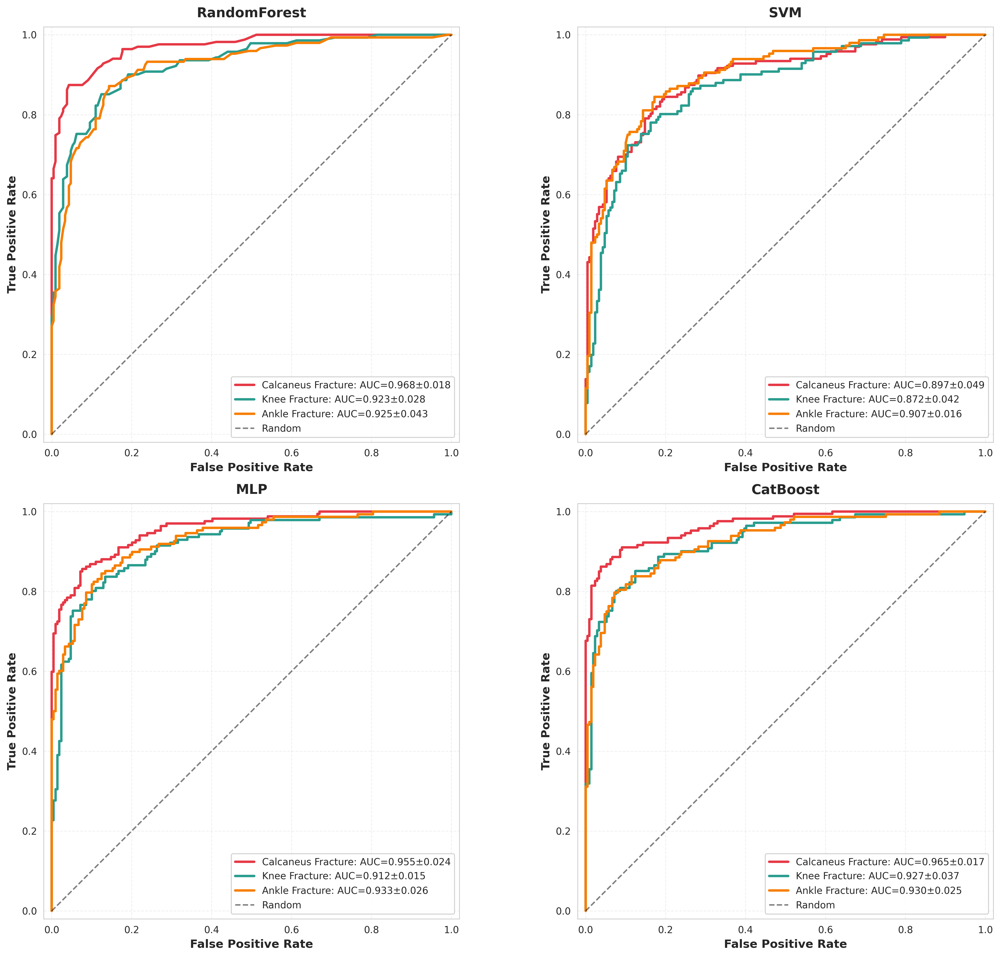

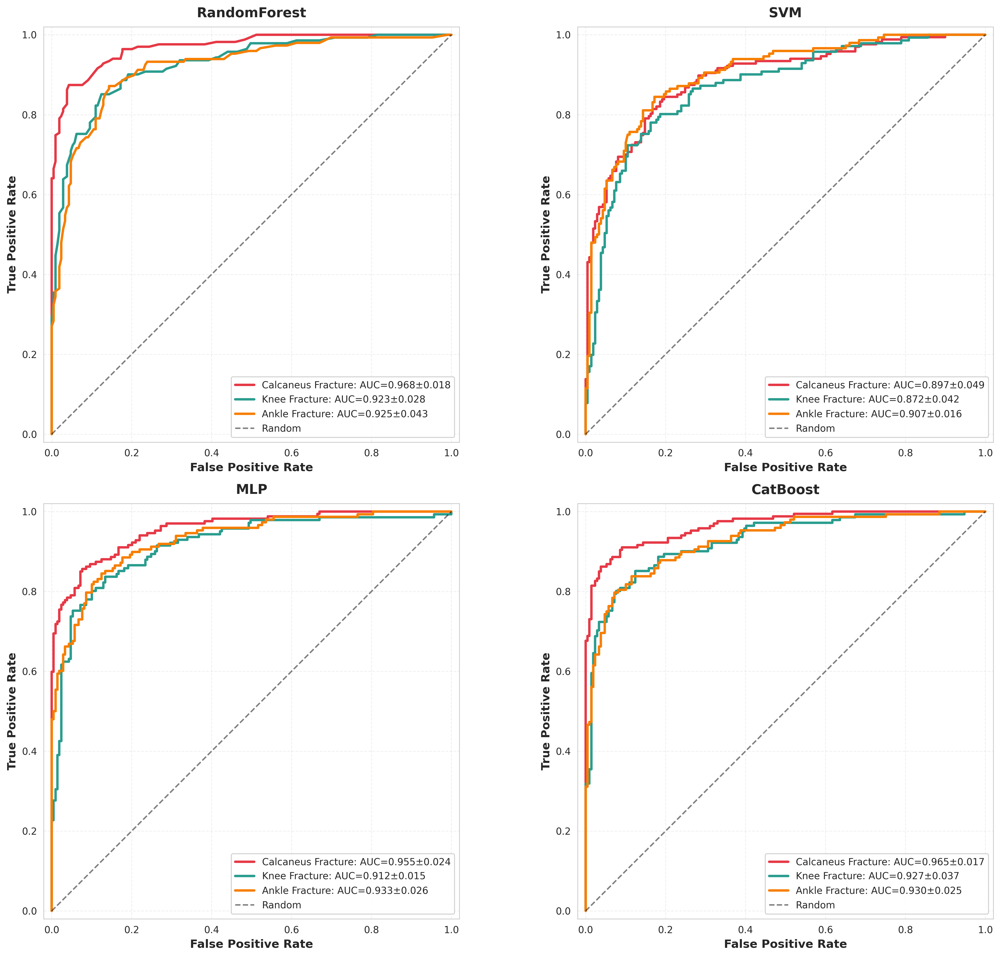

In [14]:
plot_comparative_roc_curves(all_results, disease_classes, disease_names,
                           save_path='../../assets/views/binary/comparative_roc_curves.png')

### Plot 2: Comparative Metrics Bar Chart

Comparative metrics plot saved to: ../../assets/views/binary/comparative_metrics.png


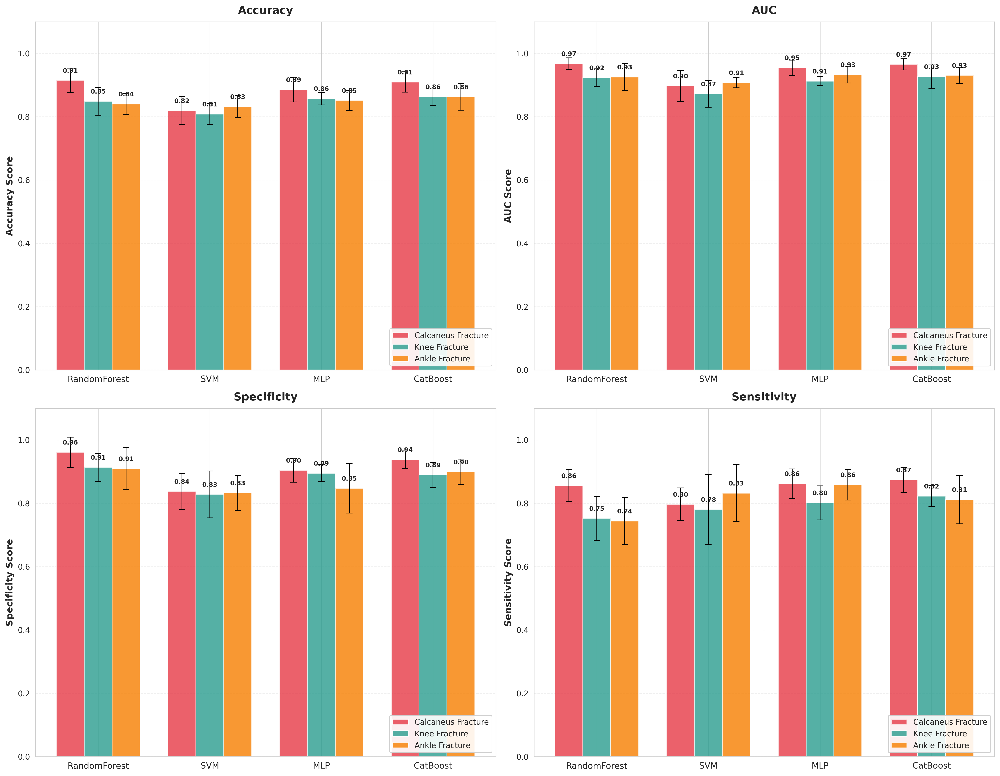

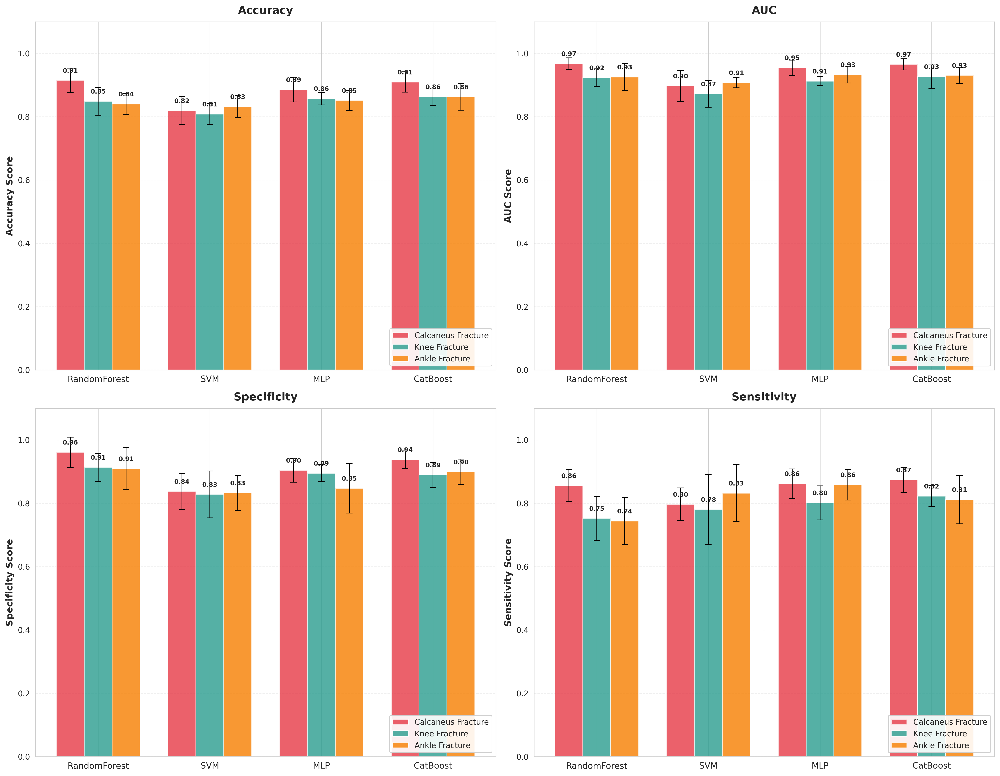

In [15]:
plot_comparative_metrics(all_results, disease_classes, disease_names,
                        save_path='../../assets/views/binary/comparative_metrics.png')

### Plot 3: Performance Heatmap

Performance heatmap saved to: ../../assets/views/binary/performance_heatmap.png


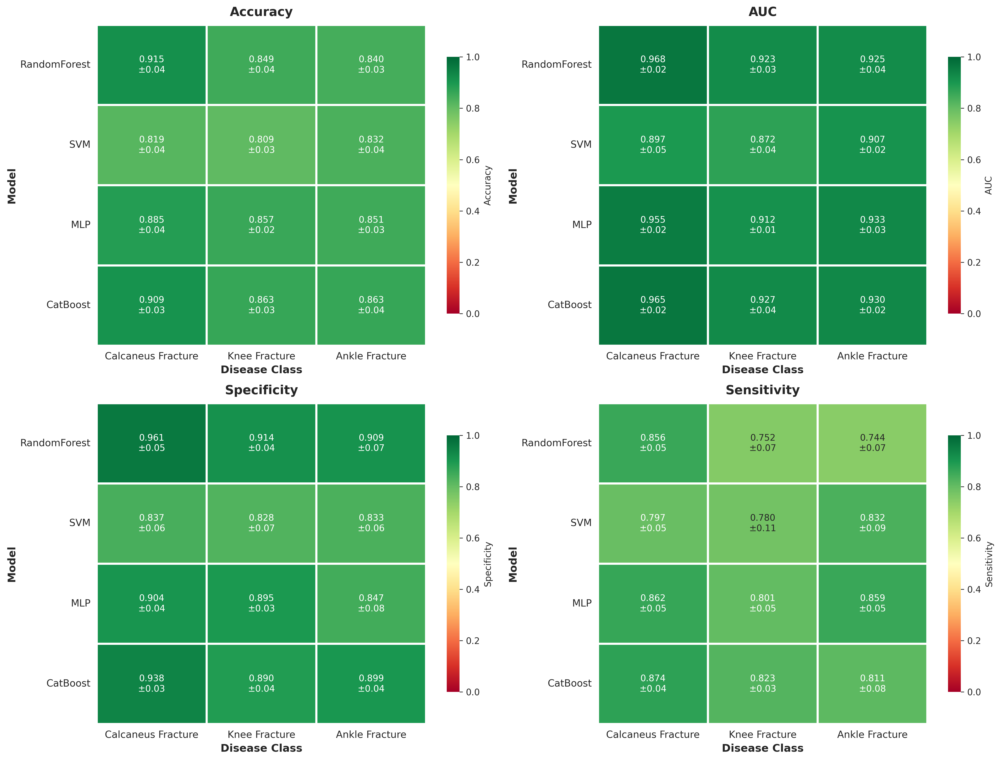

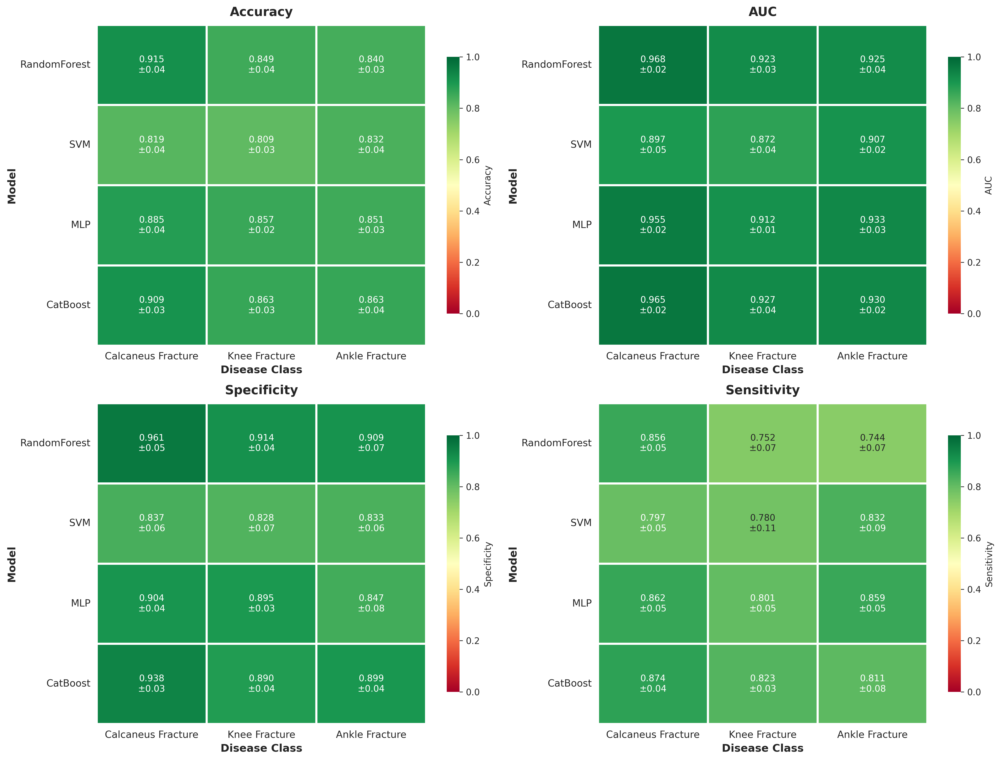

In [16]:
plot_performance_heatmap(all_results, disease_classes, disease_names,
                        save_path='../../assets/views/binary/performance_heatmap.png')

### Plot 4: Confusion Matrices by Model

Confusion matrices saved to: ../../assets/views/binary/confusion_matrices_RandomForest.png


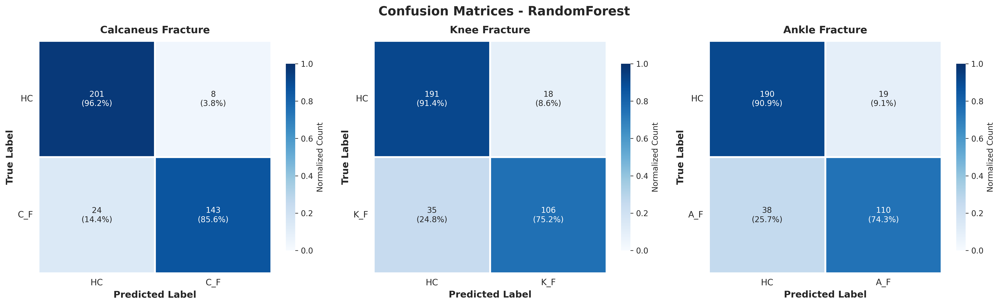

Confusion matrices saved to: ../../assets/views/binary/confusion_matrices_SVM.png


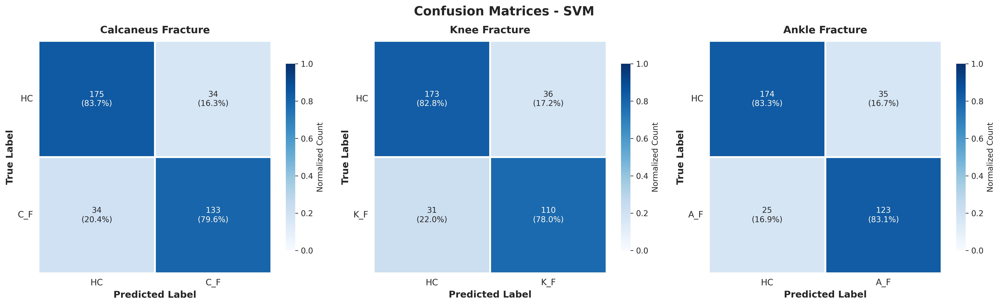

Confusion matrices saved to: ../../assets/views/binary/confusion_matrices_MLP.png


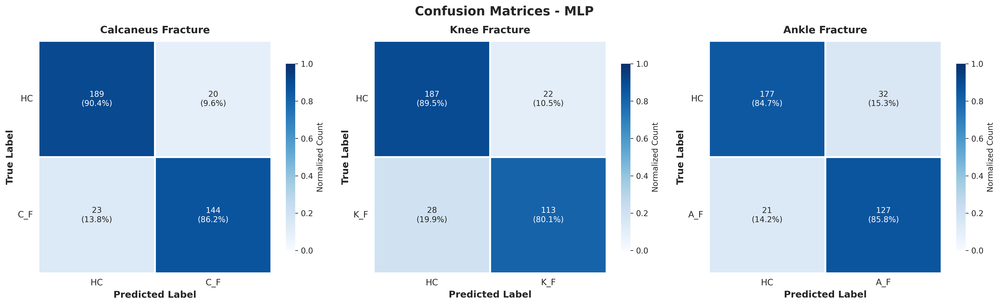

Confusion matrices saved to: ../../assets/views/binary/confusion_matrices_CatBoost.png


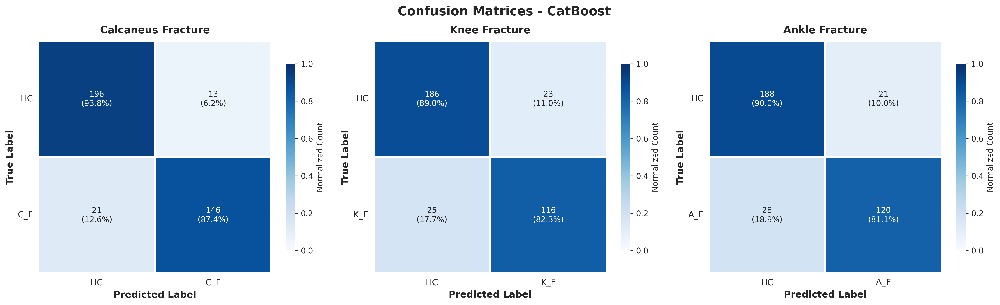

In [17]:
# Generate confusion matrices for each model
model_names = list(list(all_results.values())[0].keys())

for model_name in model_names:
    plot_comparative_confusion_matrices(all_results, disease_classes, disease_names, model_name,
                                       save_path=f'../../assets/views/binary/confusion_matrices_{model_name}.png')

### Plot 5: Comparative Learning Curves (4 separate images - one per metric)

Learning curve for Accuracy saved to: ../../assets/views/binary/learning_curves_accuracy.png


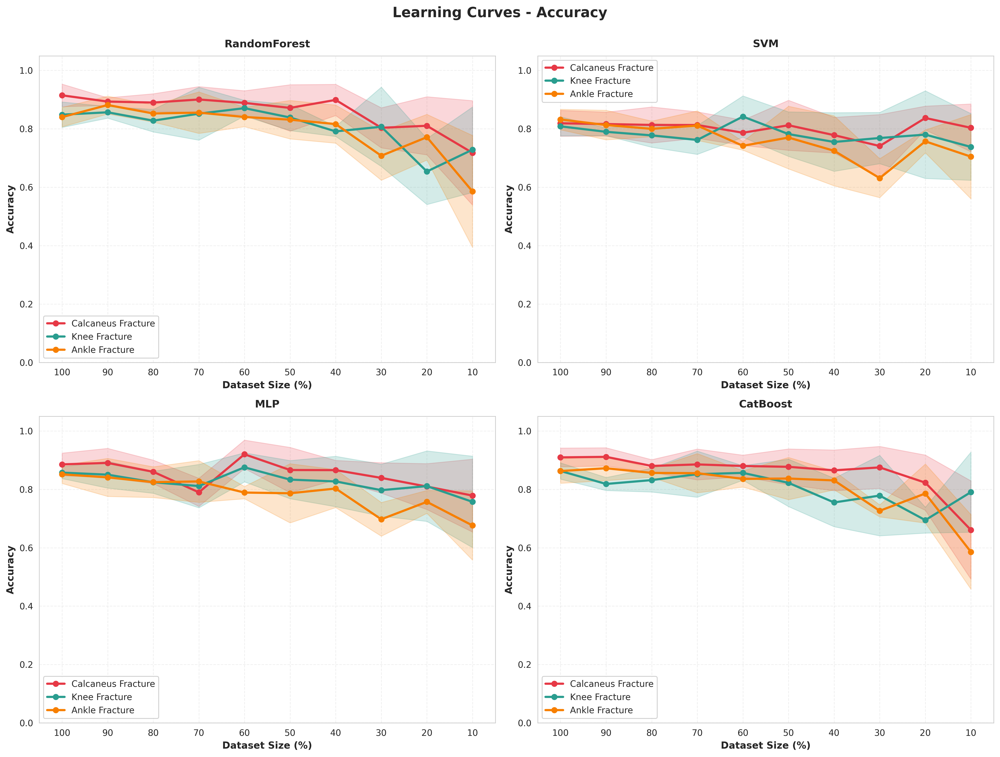

Learning curve for AUC saved to: ../../assets/views/binary/learning_curves_auc.png


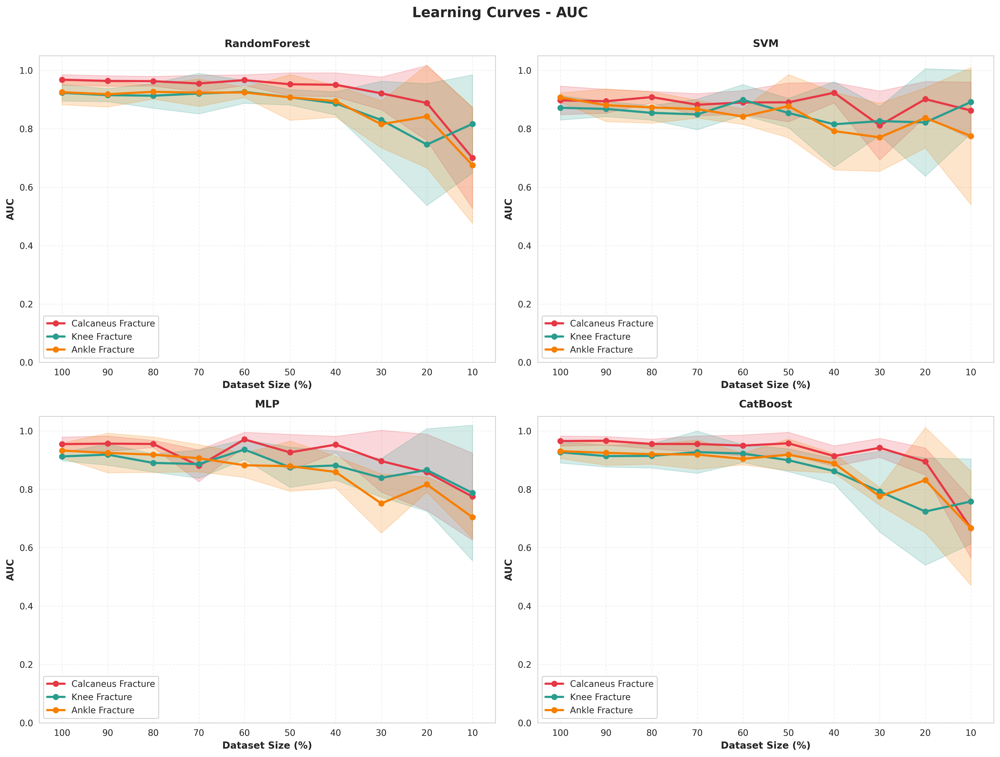

Learning curve for Specificity saved to: ../../assets/views/binary/learning_curves_specificity.png


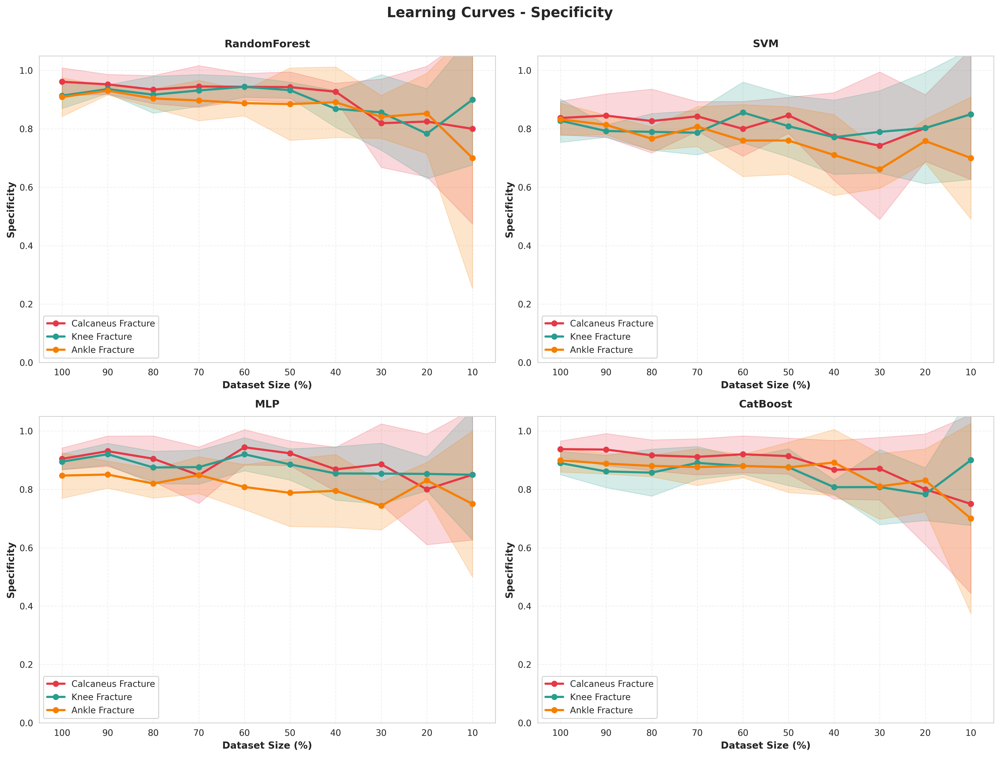

Learning curve for Sensitivity saved to: ../../assets/views/binary/learning_curves_sensitivity.png


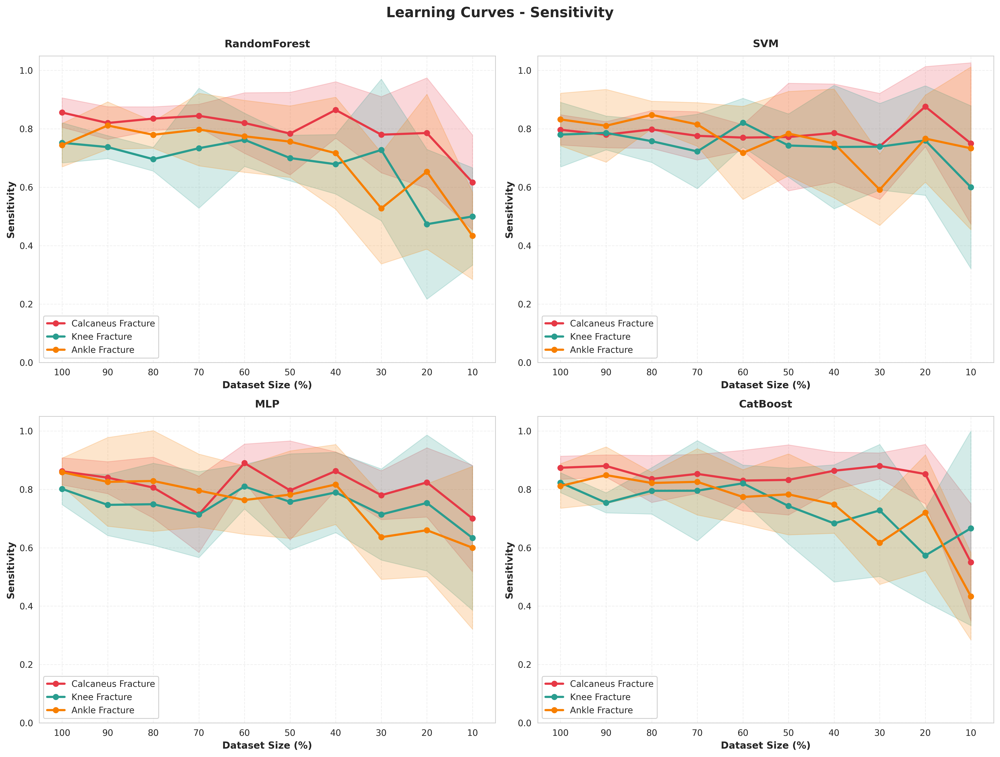

[<Figure size 4800x3600 with 4 Axes>,
 <Figure size 4800x3600 with 4 Axes>,
 <Figure size 4800x3600 with 4 Axes>,
 <Figure size 4800x3600 with 4 Axes>]

In [18]:
# Plot detailed learning curves (4 separate images, one per metric)
plot_comparative_learning_curves(fraction_results, disease_classes, disease_names,
                                 '../../assets/views/binary/learning_curves')

### Plot 6: Learning Curves by Metric (Condensed View)

Learning curves by metric saved to: ../../assets/views/binary/learning_curves_by_metric.png


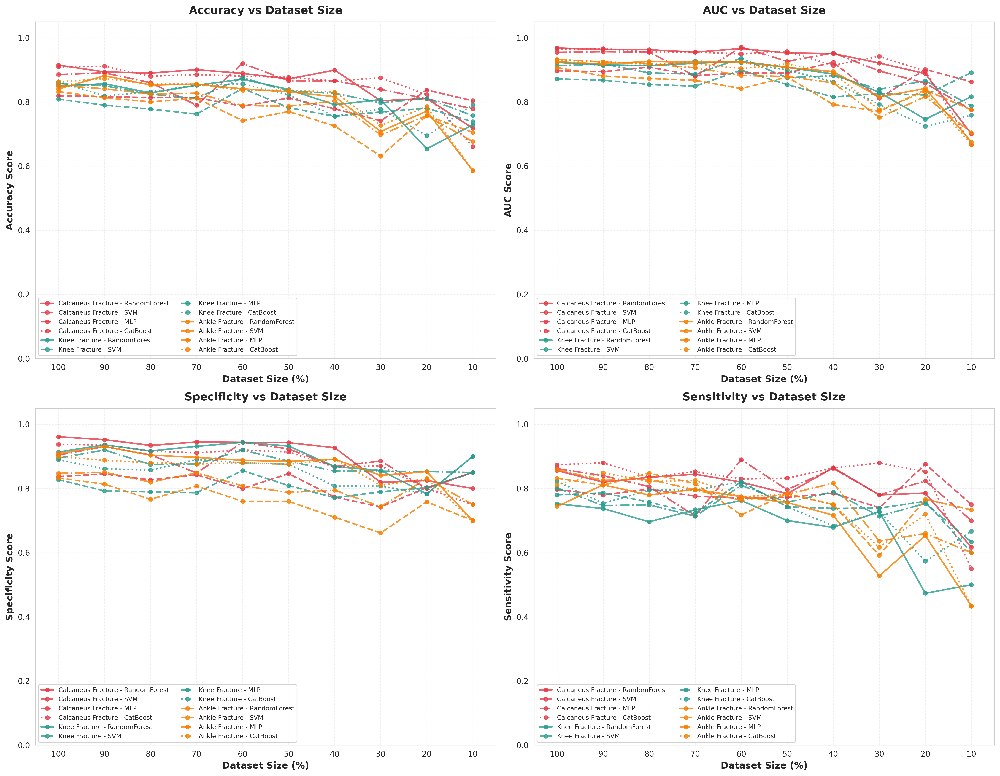

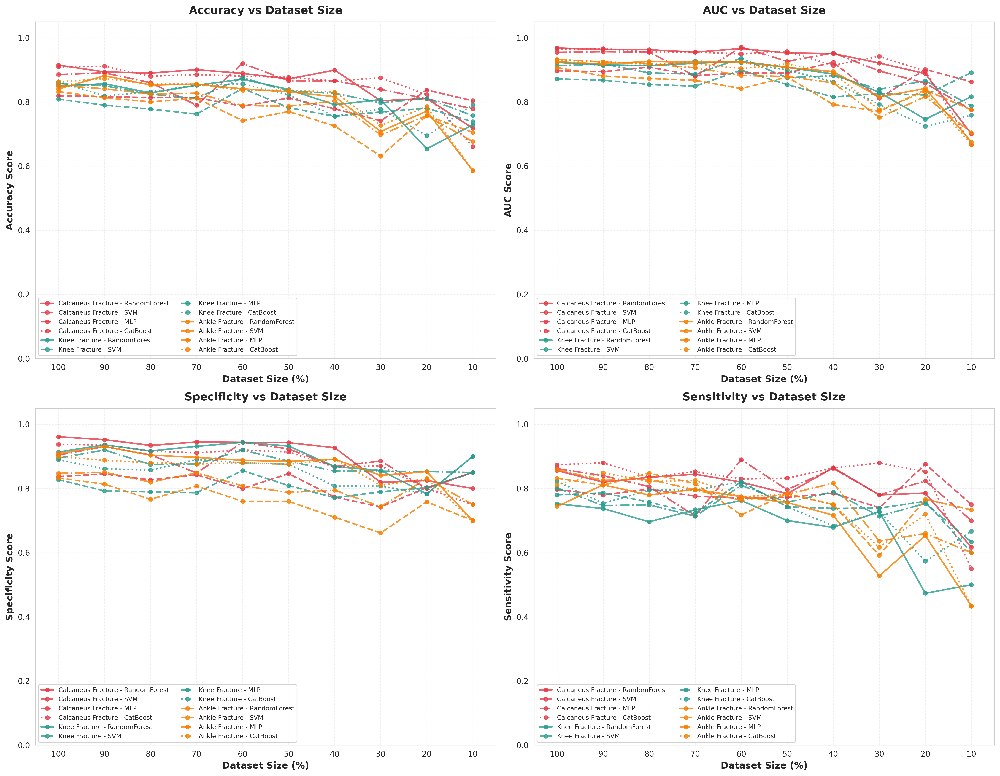

In [19]:
# Plot learning curves by metric (2x2 grid showing all models and diseases per metric)
plot_learning_curves_by_metric(fraction_results, disease_classes, disease_names,
                              save_path='../../assets/views/binary/learning_curves_by_metric.png')

## #9 Summary and Results Table

In [20]:
# Create comprehensive results tables similar to the paper
def create_comprehensive_table(fraction_results, disease_classes, disease_names):
    """
    Create a comprehensive table showing all metrics for all models, diseases, and dataset fractions.
    Similar to Table 2 in the paper.
    """
    model_names = list(list(fraction_results.values())[0][1.0].keys())
    fractions = sorted(fraction_results[disease_classes[0]].keys(), reverse=True)
    
    # Create rows for the table
    rows = []
    
    for fraction in fractions:
        fraction_pct = int(fraction * 100)
        
        for model_name in model_names:
            row = {
                '% Subjects': fraction_pct,
                'Model': model_name
            }
            
            # Add metrics for each disease class
            for disease_class in disease_classes:
                disease_label = disease_names[disease_class]
                results = fraction_results[disease_class][fraction][model_name]
                metrics = results['metrics']
                
                # Format: mean±std with 3 decimal places for mean and 2 for std
                row[f'{disease_class}_Acc'] = f"{metrics['accuracy']['mean']:.3f}±{metrics['accuracy']['std']:.2f}"
                row[f'{disease_class}_AUC'] = f"{metrics['auc']['mean']:.3f}±{metrics['auc']['std']:.2f}"
                row[f'{disease_class}_Spec'] = f"{metrics['specificity']['mean']:.3f}±{metrics['specificity']['std']:.2f}"
                row[f'{disease_class}_Sens'] = f"{metrics['sensitivity']['mean']:.3f}±{metrics['sensitivity']['std']:.2f}"
            
            rows.append(row)
    
    # Create DataFrame
    df = pd.DataFrame(rows)
    
    # Reorder columns
    base_cols = ['% Subjects', 'Model']
    metric_cols = []
    for dc in disease_classes:
        metric_cols.extend([f'{dc}_Acc', f'{dc}_AUC', f'{dc}_Spec', f'{dc}_Sens'])
    
    df = df[base_cols + metric_cols]
    
    return df

# Generate the comprehensive table
comprehensive_table = create_comprehensive_table(fraction_results, disease_classes, disease_names)

# Display the table
print("\n" + "="*150)
print("COMPREHENSIVE RESULTS TABLE: All Models, All Disease Classes, All Dataset Fractions")
print("="*150)

# Create a formatted display with disease names as column headers
display_df = comprehensive_table.copy()

# Rename columns to be more readable
column_mapping = {}
for dc in disease_classes:
    disease_label = disease_names[dc].replace(' Fracture', '')
    column_mapping[f'{dc}_Acc'] = f'{disease_label} Acc'
    column_mapping[f'{dc}_AUC'] = f'{disease_label} AUC'
    column_mapping[f'{dc}_Spec'] = f'{disease_label} Spec'
    column_mapping[f'{dc}_Sens'] = f'{disease_label} Sens'

display_df = display_df.rename(columns=column_mapping)

print(display_df.to_string(index=False))

# Save to CSV
comprehensive_table.to_csv('../../assets/views/binary/comprehensive_results_table.csv', index=False)
print("\nComprehensive table saved to: ../../assets/views/binary/comprehensive_results_table.csv")


COMPREHENSIVE RESULTS TABLE: All Models, All Disease Classes, All Dataset Fractions
 % Subjects        Model Calcaneus Acc Calcaneus AUC Calcaneus Spec Calcaneus Sens   Knee Acc   Knee AUC  Knee Spec  Knee Sens  Ankle Acc  Ankle AUC Ankle Spec Ankle Sens
        100 RandomForest    0.915±0.04    0.968±0.02     0.961±0.05     0.856±0.05 0.849±0.04 0.923±0.03 0.914±0.04 0.752±0.07 0.840±0.03 0.925±0.04 0.909±0.07 0.744±0.07
        100          SVM    0.819±0.04    0.897±0.05     0.837±0.06     0.797±0.05 0.809±0.03 0.872±0.04 0.828±0.07 0.780±0.11 0.832±0.04 0.907±0.02 0.833±0.06 0.832±0.09
        100          MLP    0.885±0.04    0.955±0.02     0.904±0.04     0.862±0.05 0.857±0.02 0.912±0.01 0.895±0.03 0.801±0.05 0.851±0.03 0.933±0.03 0.847±0.08 0.859±0.05
        100     CatBoost    0.909±0.03    0.965±0.02     0.938±0.03     0.874±0.04 0.863±0.03 0.927±0.04 0.890±0.04 0.823±0.03 0.863±0.04 0.930±0.02 0.899±0.04 0.811±0.08
         90 RandomForest    0.893±0.01    0.964±0.02     0.9

### Find best performing model for each disease class

In [21]:
print("\n" + "="*100)
print("BEST PERFORMING MODELS BY DISEASE CLASS (based on AUC)")
print("="*100)

for disease_class in disease_classes:
    best_auc = 0
    best_model = None
    
    for model_name in model_names:
        auc = all_results[disease_class][model_name]['metrics']['auc']['mean']
        if auc > best_auc:
            best_auc = auc
            best_model = model_name
    
    metrics = all_results[disease_class][best_model]['metrics']
    print(f"\n{disease_names[disease_class]} vs HC:")
    print(f"  Best Model: {best_model}")
    print(f"  AUC: {metrics['auc']['mean']:.3f} ± {metrics['auc']['std']:.3f}")
    print(f"  Accuracy: {metrics['accuracy']['mean']:.3f} ± {metrics['accuracy']['std']:.3f}")
    print(f"  Specificity: {metrics['specificity']['mean']:.3f} ± {metrics['specificity']['std']:.3f}")
    print(f"  Sensitivity: {metrics['sensitivity']['mean']:.3f} ± {metrics['sensitivity']['std']:.3f}")


BEST PERFORMING MODELS BY DISEASE CLASS (based on AUC)

Calcaneus Fracture vs HC:
  Best Model: RandomForest
  AUC: 0.968 ± 0.018
  Accuracy: 0.915 ± 0.039
  Specificity: 0.961 ± 0.048
  Sensitivity: 0.856 ± 0.050

Knee Fracture vs HC:
  Best Model: CatBoost
  AUC: 0.927 ± 0.037
  Accuracy: 0.863 ± 0.028
  Specificity: 0.890 ± 0.040
  Sensitivity: 0.823 ± 0.034

Ankle Fracture vs HC:
  Best Model: MLP
  AUC: 0.933 ± 0.026
  Accuracy: 0.851 ± 0.031
  Specificity: 0.847 ± 0.078
  Sensitivity: 0.859 ± 0.048


## Summary

This consolidated analysis allows for direct comparison of classification performance across three different fracture types:
- **Calcaneus Fracture (C_F)** vs Healthy Controls
- **Knee Fracture (K_F)** vs Healthy Controls  
- **Ankle Fracture (A_F)** vs Healthy Controls

All results are displayed in unified visualizations enabling easy identification of:
1. Which disease is most/least distinguishable from healthy controls
2. Which models perform best for each disease type
3. Consistency of model performance across disease types
4. Overall patterns in classification difficulty
5. **How performance changes with dataset size (10% to 100%)**
6. **Which disease classes are more robust to reduced training data**

### Generated Visualizations:

1. **Comparative ROC Curves** - Shows AUC performance for all diseases across all models
2. **Comparative Metrics Bar Chart** - Side-by-side comparison of all metrics
3. **Performance Heatmap** - Matrix view of model performance across diseases
4. **Confusion Matrices** - Detailed classification results per model
5. **Learning Curves (Detailed)** - 4x4 grid showing performance vs dataset size for each metric and model
6. **Learning Curves (Condensed)** - 2x2 grid showing all models and diseases per metric

All plots are saved in the `../../assets/views/binary/` directory and results are exported to CSV for further analysis.